# Flight Delay Prediction - Assignment

__Description:__
The goal of this task is to evaluate your data preparation, analysis and modeling skills. You receive on-time airline performance data and the question we would like you to answer is:

What departure delay is expected for any scheduled flight in the test set? What is an error of the model's prediction on the test set?

Things to note:
1. Data consists of 14 months, where 12 months (07.2018 - 06.2019) are for training/validation and
2 months (07.2019 - 08.2019) for testing purposes.
2. DepDelay (in minutes) is your target variable.
3. From an operational perspective, flight is classified as delayed, when it is late 15 minutes or more.
4. Scheduled departure time of the flight is the last available moment for doing prediction.
5. For modeling/analysis use a subset of 8 carriers, which are the most common in the dataset.
6. Feel free to use any publicly available information/dataset for feature engineering.
7. Don’t forget about exploratory data analysis (at least 3 questions & answers).

In [1]:
import glob
import os
import pickle

import pandas as pd
import numpy as np

import datetime
from pandas.tseries.holiday import USFederalHolidayCalendar

import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")
sns.set_palette("colorblind")

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict
from sklearn.metrics import mean_squared_error
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

from sklearn.model_selection import RandomizedSearchCV

from sklearn.linear_model import Lasso, LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor

import xgboost as xgb

In [2]:
# Dataset Checkpoint:

# with open("flight_df", "rb") as fp:
#     flight_df = pickle.load(fp)

# with open("flight_train_df", "rb") as fp:
#     flight_train_df = pickle.load(fp)

### Part 1: Data Loading & Simple Data Cleaning

#### 1.1 - Loading the dataset:

In [2]:
# Merging all csv files:
joined_files = os.path.join("DS_Assignment_Data", "*.csv")
joined_list = glob.glob(joined_files)

flight_df = pd.concat(map(pd.read_csv, joined_list), ignore_index=True)

In [ ]:
print(flight_df.shape)

pd.set_option('display.max_columns', None)

(8623670, 23)


Checking the columns of the dataset:

In [ ]:
flight_df.columns

Index(['FL_DATE', 'OP_UNIQUE_CARRIER', 'OP_CARRIER_FL_NUM', 'ORIGIN', 'DEST',
       'CRS_DEP_TIME', 'DEP_TIME', 'DEP_DELAY', 'CRS_ARR_TIME', 'ARR_TIME',
       'ARR_DELAY', 'CANCELLED', 'CANCELLATION_CODE', 'CRS_ELAPSED_TIME',
       'ACTUAL_ELAPSED_TIME', 'AIR_TIME', 'DISTANCE', 'CARRIER_DELAY',
       'WEATHER_DELAY', 'NAS_DELAY', 'SECURITY_DELAY', 'LATE_AIRCRAFT_DELAY',
       'Unnamed: 22'],
      dtype='object')

Feature explanations (from Kaggle):

- FL_DATE = Date of the Flight
- OP__UNIQUE_CARRIER = Airline Identifier
- OP_CARRIER_FL_NUM = Flight Number
- ORIGIN = Starting Airport Code
- DEST = Destination Airport Code
- CRS_DEP_TIME = Planned Departure Time
- DEP_TIME = Actual Departure Time
- DEP_DELAY = Total Delay on Departure in minutes
- CRS_ARR_TIME = Planned arrival time
- ARR_TIME = Actual Arrival Time = ARRIVAL_TIME - SCHEDULED_ARRIVAL
- ARR_DELAY = Total Delay on Arrival in minutes
- CANCELLED = Flight Cancelled (1 = cancelled)
- CANCELLATION_CODE = Reason for Cancellation of flight: A - Airline/Carrier; B - Weather; C - National Air System; D - Security
- CRS_ELAPSED_TIME = Planned time amount needed for the flight trip
- ACTUAL_ELAPSED_TIME = AIR_TIME+TAXI_IN+TAXI_OUT
- AIR_TIME = The time duration between wheels_off and wheels_on time
- DISTANCE = Distance between two airports
- CARRIER_DELAY = Delay caused by the airline in minutes
- WEATHER_DELAY = Delay caused by weather
- NAS_DELAY = Delay caused by air system
- SECURITY_DELAY = caused by security reasons
- LATE_AIRCRAFT_DELAY = Delay caused by security

#### 1.2 - Data Cleaning:

The dataset has 8.6M rows, so decreasing this number before further analysis is priority for better performance. Filtering for top 8 carriers for easier analysis as instructed:

In [ ]:
top8_car = flight_df.OP_UNIQUE_CARRIER.value_counts()[:8].index.tolist()
flight_df = flight_df.loc[flight_df.OP_UNIQUE_CARRIER.isin(top8_car),:]


In [ ]:
flight_df.head()

,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_FL_NUM,ORIGIN,DEST,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,CANCELLED,CANCELLATION_CODE,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,DISTANCE,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,Unnamed: 22
137,2018-07-01,AA,420,PHX,DEN,1505,1500.0,-5.0,1748,1748.0,0.0,0.0,NaN,103.0,108.0,86.0,602.0,NaN,NaN,NaN,NaN,NaN,NaN
138,2018-07-01,AA,421,PHX,RNO,1702,1742.0,40.0,1842,1917.0,35.0,0.0,NaN,100.0,95.0,79.0,601.0,35.0,0.0,0.0,0.0,0.0,NaN
139,2018-07-01,AA,421,RNO,PHX,1928,2014.0,46.0,2113,2154.0,41.0,0.0,NaN,105.0,100.0,84.0,601.0,15.0,0.0,0.0,0.0,26.0,NaN
140,2018-07-01,AA,422,MCO,DFW,1931,2015.0,44.0,2120,2152.0,32.0,0.0,NaN,169.0,157.0,129.0,985.0,0.0,30.0,0.0,0.0,2.0,NaN
141,2018-07-01,AA,422,PHL,MCO,1555,1555.0,0.0,1836,1844.0,8.0,0.0,NaN,161.0,169.0,128.0,861.0,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
flight_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6639163 entries, 137 to 8623669
Data columns (total 23 columns):
 #   Column               Dtype  
---  ------               -----  
 0   FL_DATE              object 
 1   OP_UNIQUE_CARRIER    object 
 2   OP_CARRIER_FL_NUM    int64  
 3   ORIGIN               object 
 4   DEST                 object 
 5   CRS_DEP_TIME         int64  
 6   DEP_TIME             float64
 7   DEP_DELAY            float64
 8   CRS_ARR_TIME         int64  
 9   ARR_TIME             float64
 10  ARR_DELAY            float64
 11  CANCELLED            float64
 12  CANCELLATION_CODE    object 
 13  CRS_ELAPSED_TIME     float64
 14  ACTUAL_ELAPSED_TIME  float64
 15  AIR_TIME             float64
 16  DISTANCE             float64
 17  CARRIER_DELAY        float64
 18  WEATHER_DELAY        float64
 19  NAS_DELAY            float64
 20  SECURITY_DELAY       float64
 21  LATE_AIRCRAFT_DELAY  float64
 22  Unnamed: 22          float64
dtypes: float64(15), int64(3), obje

__Missing Values:__

In [ ]:
flight_df.isna().sum().sort_values(ascending=False)

Unnamed: 22            6639163
CANCELLATION_CODE      6523335
LATE_AIRCRAFT_DELAY    5348731
SECURITY_DELAY         5348731
NAS_DELAY              5348731
WEATHER_DELAY          5348731
CARRIER_DELAY          5348731
ACTUAL_ELAPSED_TIME     134342
ARR_DELAY               134342
AIR_TIME                134342
ARR_TIME                118222
DEP_DELAY               111666
DEP_TIME                111615
DISTANCE                     0
FL_DATE                      0
CRS_ELAPSED_TIME             0
OP_UNIQUE_CARRIER            0
CRS_ARR_TIME                 0
CRS_DEP_TIME                 0
DEST                         0
ORIGIN                       0
OP_CARRIER_FL_NUM            0
CANCELLED                    0
dtype: int64

__First Observations:__

1) Unnamed is an empty column -> should be dropped 
2) OP_CARRIER_FL_NUM can be dropped, flight number identifier used by airlines, no information related to the flight delay
3) DEP_DELAY -> missing values in the target variable
4) DELAY columns -> a lot of missing values


In [ ]:
# TTD 1: dropping the empty column:
flight_df.drop("Unnamed: 22", axis=1, inplace=True)

In [ ]:
# TTD 2: OP_CARRIER_FL_NUM
print(f"Number of total flight numbers: {flight_df.OP_CARRIER_FL_NUM.nunique()}")

flight_df.drop("OP_CARRIER_FL_NUM", axis=1, inplace=True)

Number of total flight numbers: 7064


In [ ]:
# TTD 3: Analyzing missing DEP_DELAYs:
flight_df[flight_df.DEP_DELAY.isna()].head()

,FL_DATE,OP_UNIQUE_CARRIER,ORIGIN,DEST,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,CANCELLED,CANCELLATION_CODE,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,DISTANCE,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY
429,2018-07-01,AA,DFW,ORD,1145,NaN,NaN,1403,NaN,NaN,1.0,A,138.0,NaN,NaN,802.0,NaN,NaN,NaN,NaN,NaN
644,2018-07-01,AA,ORD,DCA,1900,NaN,NaN,2201,NaN,NaN,1.0,B,121.0,NaN,NaN,612.0,NaN,NaN,NaN,NaN,NaN
978,2018-07-01,YX,CVG,ORD,1945,NaN,NaN,2014,NaN,NaN,1.0,A,89.0,NaN,NaN,264.0,NaN,NaN,NaN,NaN,NaN
1045,2018-07-01,YX,IND,ORD,1840,NaN,NaN,1850,NaN,NaN,1.0,C,70.0,NaN,NaN,177.0,NaN,NaN,NaN,NaN,NaN
1047,2018-07-01,YX,ORD,IND,1935,NaN,NaN,2146,NaN,NaN,1.0,A,71.0,NaN,NaN,177.0,NaN,NaN,NaN,NaN,NaN


In [ ]:
flight_df.CANCELLED.value_counts()


0.0    6523335
1.0     115828
Name: CANCELLED, dtype: int64

It seems that all missing records were cancelled flights.

In [ ]:
flight_df[flight_df.DEP_DELAY.isna()].CANCELLED.value_counts()


1.0    111666
Name: CANCELLED, dtype: int64

Interestingly, 4162 flights were cancelled but also have associated DEP_DELAY. These are only .06% of the dataset, but interesting to note:

In [ ]:
print(f'Number of cancelled & delayed flights: {len(flight_df[(flight_df.CANCELLED == 1) & (flight_df.DEP_DELAY.notna())])}')
print(f'Percentage of cancelled & delayed flights: {round(len(flight_df[(flight_df.CANCELLED == 1) & (flight_df.DEP_DELAY.notna())])*100/len(flight_df),2)}%')


Number of cancelled & delayed flights: 4162
Percentage of cancelled & delayed flights: 0.06%


These will be dropped along with the rest of the cancelled flights.

Cancelled flights cause lots of missing features including DEP_DELAY, as they are a different problem & case entirely. These records have no purpose for our problem at hand and can be dropped from the dataset:


In [ ]:
flight_df = flight_df.loc[flight_df.CANCELLED == 0,:]

CANCELLATION_CODE column is now missing for these non-cancelled records & has no purpose:


In [ ]:
flight_df.CANCELLATION_CODE.notna().value_counts()

False    6523335
Name: CANCELLATION_CODE, dtype: int64

Finally, both columns associated with "cancellation" can be dropped:

In [ ]:
flight_df.drop(["CANCELLATION_CODE","CANCELLED"], axis=1, inplace=True)

In [ ]:
# Recheking for missing values:
flight_df.isna().sum().sort_values(ascending=False)

LATE_AIRCRAFT_DELAY    5232903
SECURITY_DELAY         5232903
NAS_DELAY              5232903
WEATHER_DELAY          5232903
CARRIER_DELAY          5232903
ACTUAL_ELAPSED_TIME      18514
AIR_TIME                 18514
ARR_DELAY                18514
ARR_TIME                  2394
OP_UNIQUE_CARRIER            0
CRS_ELAPSED_TIME             0
CRS_ARR_TIME                 0
DEP_DELAY                    0
DISTANCE                     0
DEP_TIME                     0
CRS_DEP_TIME                 0
DEST                         0
ORIGIN                       0
FL_DATE                      0
dtype: int64

In [ ]:
# TTD 4: Checking DELAY columns:
print(f'Percentage of missing "DELAY reason" columns: {round(flight_df.LATE_AIRCRAFT_DELAY.isna().sum()*100/len(flight_df),1)}%')

# Checking if missing rows are all on-time flights:
flight_df[flight_df.LATE_AIRCRAFT_DELAY.isna()].DEP_DELAY.map(lambda x: True if x>0 else False).value_counts()

Percentage of missing "DELAY reason" columns: 80.2%


False    4004879
True     1228024
Name: DEP_DELAY, dtype: int64

These columns are both missing for the majority of the datasets, and the missing rows do not only account for on-time flights. This shows us that these columns are possibly not accurate & can not give us reliable information. These will also be dropped:

In [ ]:
delay_cols = ["LATE_AIRCRAFT_DELAY", "SECURITY_DELAY", "NAS_DELAY", "WEATHER_DELAY", "CARRIER_DELAY"]

flight_df.drop(delay_cols, axis=1, inplace=True)

In [ ]:
flight_df.sample(5)

,FL_DATE,OP_UNIQUE_CARRIER,ORIGIN,DEST,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,DISTANCE
938925,2018-08-14,B6,FLL,DCA,1640,1822.0,102.0,1913,2102.0,109.0,153.0,160.0,129.0,899.0
528665,2018-07-26,AA,PHL,ATL,805,809.0,4.0,1016,1009.0,-7.0,131.0,120.0,91.0,666.0
4169974,2019-01-27,B6,DCA,FLL,1620,1655.0,35.0,1905,1956.0,51.0,165.0,181.0,145.0,899.0
936217,2018-08-14,WN,MHT,MCO,1110,1109.0,-1.0,1410,1409.0,-1.0,180.0,180.0,163.0,1142.0
7112275,2019-06-21,WN,MDW,EWR,1115,1123.0,8.0,1420,1425.0,5.0,125.0,122.0,104.0,711.0


In [ ]:
# TTD 5: Rest of the missing values:
flight_df.isna().sum().sort_values(ascending=False)

ARR_DELAY              18514
ACTUAL_ELAPSED_TIME    18514
AIR_TIME               18514
ARR_TIME                2394
FL_DATE                    0
OP_UNIQUE_CARRIER          0
ORIGIN                     0
DEST                       0
CRS_DEP_TIME               0
DEP_TIME                   0
DEP_DELAY                  0
CRS_ARR_TIME               0
CRS_ELAPSED_TIME           0
DISTANCE                   0
dtype: int64

For non-missing ARR_TIME records, all the missing columns can be calculated, except for AIR_TIME.


However, it is seen the remaining missing columns are all from the same records, which make up the .3% of the total dataset. Therefore, dropping these records would get rid of all missing values without causing any problems due to their size:

In [ ]:
print(f'Percentage of missing records: {round(flight_df.ARR_DELAY.isna().sum()*100/len(flight_df),1)}%')

flight_df.isna().sum(axis=1).value_counts()

Percentage of missing records: 0.3%


0    6504821
3      16120
4       2394
dtype: int64

In [ ]:
flight_df.dropna(inplace=True)

In [ ]:
# Recheking the dataset for missing values:
flight_df.isna().sum()

FL_DATE                0
OP_UNIQUE_CARRIER      0
ORIGIN                 0
DEST                   0
CRS_DEP_TIME           0
DEP_TIME               0
DEP_DELAY              0
CRS_ARR_TIME           0
ARR_TIME               0
ARR_DELAY              0
CRS_ELAPSED_TIME       0
ACTUAL_ELAPSED_TIME    0
AIR_TIME               0
DISTANCE               0
dtype: int64

The dataset is now loaded & cleaned from missing values. It is ready for further preprocesing.

### Part 2: Data Preprocessing

In [ ]:
flight_df_copy = flight_df.copy()

In [ ]:
flight_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6504821 entries, 137 to 8623669
Data columns (total 14 columns):
 #   Column               Dtype  
---  ------               -----  
 0   FL_DATE              object 
 1   OP_UNIQUE_CARRIER    object 
 2   ORIGIN               object 
 3   DEST                 object 
 4   CRS_DEP_TIME         int64  
 5   DEP_TIME             float64
 6   DEP_DELAY            float64
 7   CRS_ARR_TIME         int64  
 8   ARR_TIME             float64
 9   ARR_DELAY            float64
 10  CRS_ELAPSED_TIME     float64
 11  ACTUAL_ELAPSED_TIME  float64
 12  AIR_TIME             float64
 13  DISTANCE             float64
dtypes: float64(8), int64(2), object(4)
memory usage: 744.4+ MB


#### __Observations:__

- FL_DATE                               
    - should be converted to datetime 
    - includes useful information such as the month, day of the month, and day of the week
    - can add a column for holidays
<br>
<br>

- OP_UNIQUE_CARRIER                     
    - 8 carriers in total 
    - can be converted to full airline names for more clear analysis & graphs during EDA
<br>
<br>

- ORIGIN & DEST                         
  - how many places in total?
  - can be used to merge full airport/city/state names to get more information & detail
<br>
<br>

- TIME related columns
    - should be converted to datetime 
    - can be useful during feature engineering (rounded hour)
<br>
<br>

- DURATION related columns:
    - convert all to same dtype
<br>
<br>

- Outliers:
    - need to check DEP_DELAY distribution

#### 2.1 - DATE column:

In [ ]:
# Converting to datetime:
flight_df["FL_DATE"] = pd.to_datetime(flight_df.FL_DATE)

# Creating month, day, day of week columns:
flight_df["fl_month"] = flight_df.FL_DATE.map(lambda x: x.month)
flight_df["fl_day"] = flight_df.FL_DATE.map(lambda x: x.day)
flight_df["fl_dow"] = flight_df.FL_DATE.map(lambda x: x.dayofweek)

In [ ]:
flight_df.head()

,FL_DATE,OP_UNIQUE_CARRIER,ORIGIN,DEST,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,DISTANCE,fl_month,fl_day,fl_dow
137,2018-07-01,AA,PHX,DEN,1505,1500.0,-5.0,1748,1748.0,0.0,103.0,108.0,86.0,602.0,7,1,6
138,2018-07-01,AA,PHX,RNO,1702,1742.0,40.0,1842,1917.0,35.0,100.0,95.0,79.0,601.0,7,1,6
139,2018-07-01,AA,RNO,PHX,1928,2014.0,46.0,2113,2154.0,41.0,105.0,100.0,84.0,601.0,7,1,6
140,2018-07-01,AA,MCO,DFW,1931,2015.0,44.0,2120,2152.0,32.0,169.0,157.0,129.0,985.0,7,1,6
141,2018-07-01,AA,PHL,MCO,1555,1555.0,0.0,1836,1844.0,8.0,161.0,169.0,128.0,861.0,7,1,6


A major factor that might be affecting flight delays can be holidays when a lot of people are travelling. To account for this, we can use a holiday calendar to mark any flight that are on or 2 days before or after a holiday in the US, assuming a person travelling for a holiday would probably arrive and leave couple of days prior to the actual holiday date.

In [ ]:
cal = USFederalHolidayCalendar()
holidays = cal.holidays(start='2018-07-01', end='2019-08-31').to_pydatetime()


In [ ]:
list(holidays)

[datetime.datetime(2018, 7, 4, 0, 0),
 datetime.datetime(2018, 9, 3, 0, 0),
 datetime.datetime(2018, 10, 8, 0, 0),
 datetime.datetime(2018, 11, 12, 0, 0),
 datetime.datetime(2018, 11, 22, 0, 0),
 datetime.datetime(2018, 12, 25, 0, 0),
 datetime.datetime(2019, 1, 1, 0, 0),
 datetime.datetime(2019, 1, 21, 0, 0),
 datetime.datetime(2019, 2, 18, 0, 0),
 datetime.datetime(2019, 5, 27, 0, 0),
 datetime.datetime(2019, 7, 4, 0, 0)]

In [ ]:
holidays_extended = [hol+datetime.timedelta(days=i) for hol in holidays for i in range(-2,3)]

In [ ]:
flight_df["is_holiday"] = flight_df.FL_DATE.map(lambda x: x in holidays_extended)

In [ ]:
flight_df.is_holiday.value_counts(normalize=True)

False    0.880953
True     0.119047
Name: is_holiday, dtype: float64

It seems that around 12% of the flights in the dataset were holiday associated. Whether this actually effects the departure delay can be further analyzed during EDA.

#### 2.2 - OP_UNIQUE_CARRIER column

In [ ]:
# As we have already filtered the dataset for airlines, therea are only 8 carriers in the dataset. A simple dict can be used to convert them to full carrier names

flight_df.OP_UNIQUE_CARRIER.value_counts()

WN    1557845
DL    1143708
AA    1069013
OO     932229
UA     735765
YX     364388
MQ     356843
B6     345030
Name: OP_UNIQUE_CARRIER, dtype: int64

In [ ]:
# Full list available on: https://gist.githubusercontent.com/AndreiCalazans/390e82a1c3edff852137cb3da813eceb/raw/1a1248f966b3f644f4eae057ad9b9b1b571c6aec/airlines.json

carrier_dict ={
"WN": "Southwest Airlines", 
"DL": "Delta Air Lines",
"AA": "American Airlines",
"OO": "SkyWest Airlines",
"UA": "United Airlines",
"YX": "Midwest Airlines",
"MQ": "American Eagle Airlines",
"B6": "JetBlue Airways"}

flight_df["airline_name"] = flight_df.OP_UNIQUE_CARRIER.map(carrier_dict)

flight_df.drop("OP_UNIQUE_CARRIER", axis=1, inplace=True)

#### 2.3  -  ORIGIN & DEST columns:

In [ ]:
# How many places in total?
print(f"Number of origin airports: {flight_df.ORIGIN.nunique()}")
print(f"Number of destination airports: {flight_df.DEST.nunique()}")

print(f"Total number of airports in the dataset: {len(set(flight_df.ORIGIN.unique().tolist()).union(set(flight_df.DEST.unique().tolist())))}")


Number of origin airports: 317
Number of destination airports: 317
Total number of airports in the dataset: 317


A quick analysis shows that the airport codes in flight_df are in fact iata codes. They can be used to merge airport_df, to get more inforation abou the airports. Will skip for now due to time concerns.


In [ ]:
# Can use an airport dataset to get more information about these airports:

airport_df = pd.read_csv("https://raw.githubusercontent.com/mborsetti/airportsdata/main/airportsdata/airports.csv")
airport_df = airport_df[airport_df.iata.notna()].set_index("iata")[["name","city","subd","country","elevation"]]

airport_df.head()


,name,city,subd,country,elevation
iata,,,,,
ICY,Icy Bay Airport,Icy Bay,Alaska,US,50
HGZ,Hog River Airport,Hogatza,Alaska,US,534
BYW,Blakely Island Airport,Blakely Island,Washington,US,66
BDF,Rinkenberger Restricted Landing Area,Bradford,Illinois,US,808
BCS,Southern Seaplane Airport,Belle Chasse,Louisiana,US,0


Due to the high cardinality of this variable, one-hot encoding this later on will cause a lot of features in the training dataset, which will most likely decrease model performance. To address this, we can use grouping/binning  multiple values into a single category.

For this specific airport problem we can use location to group airports to their cities, states, etc. based on geographical information.

Instead, we can also use the already available flight related variables such as rate/number of flights & rate/number of delays & avg. dedlay time to divide aiports based on their performances. For this project, the airports were categorized by target encoding into 4 equal groups based on their average delays as ORIGIN and DEST airports, decreasing both variables' dimensions from 317 to 4.

It is a univariate analysis & process but still can capture & represent majority of the information regarding airports.

__ORIGIN Airport Grouping__

In [ ]:
flight_df.groupby("ORIGIN")["DEP_DELAY"].mean().sort_values().describe()

count    317.000000
mean      -2.426646
std        2.532447
min      -10.889085
25%       -4.030451
50%       -2.250825
75%       -0.801189
max        5.400736
Name: DEP_DELAY, dtype: float64

In [ ]:
flight_df.groupby("ORIGIN")["DEP_DELAY"].mean().sort_values()

ORIGIN
EAR   -10.889085
JMS    -9.818376
DVL    -9.330592
ATY    -9.080508
MKG    -8.636879
         ...    
OAK     3.268401
HYA     3.389831
DAL     4.566380
HOU     5.025777
MDW     5.400736
Name: DEP_DELAY, Length: 317, dtype: float64

In [ ]:
bin_labels = [0, 1, 2, 3]

orig_delay_dict = pd.qcut(flight_df.groupby("ORIGIN")["DEP_DELAY"].mean().sort_values(), q=[0, .25, .5, .75, 1],labels=bin_labels).to_dict()


__DEST Airport Binning:__

In [ ]:
flight_df.groupby("DEST")["DEP_DELAY"].mean().sort_values().describe()

count    317.000000
mean      -0.508346
std        1.964257
min       -9.710660
25%       -1.674291
50%       -0.315623
75%        0.767226
max        3.620155
Name: DEP_DELAY, dtype: float64

In [ ]:
flight_df.groupby("DEST")["DEP_DELAY"].mean().sort_values()

DEST
DVL   -9.710660
ATY   -7.827586
SLN   -7.375000
LBL   -6.683307
PBG   -5.947177
         ...   
DAL    2.967520
BQN    3.061238
HOU    3.178358
PSE    3.471850
KTN    3.620155
Name: DEP_DELAY, Length: 317, dtype: float64

In [ ]:
dest_delay_dict = pd.qcut(flight_df.groupby("DEST")["DEP_DELAY"].mean().sort_values(), q=[0, .25, .5, .75, 1],labels=bin_labels).to_dict()


In [ ]:
flight_df["orig_delay_rate"] = flight_df.ORIGIN.map(orig_delay_dict)
flight_df["dest_delay_rate"] = flight_df.DEST.map(dest_delay_dict)

Average delays of both groupings:

In [4]:
flight_df.groupby("orig_delay_rate")["DEP_DELAY"].mean()

orig_delay_rate
0   -5.201385
1   -2.840188
2   -1.354322
3    1.101547
Name: DEP_DELAY, dtype: float64

In [5]:
flight_df.groupby("dest_delay_rate")["DEP_DELAY"].mean()

dest_delay_rate
0   -2.620363
1   -0.841454
2    0.144781
3    1.741836
Name: DEP_DELAY, dtype: float64

#### 2.4 - TIME column:

In [ ]:
# It is seen that all time related columns (including both departure & arrival) are in numerical (int or float) format. 
# However, due to the time of the flight, these columns can have between 1 to 4 digit numbers in (Hour):(Minute) format due to 0 hour, or single digit minutes.

# All time columns should be standardized & converted:

# Checking the lengths:
flight_df.CRS_DEP_TIME.map(str).map(len).value_counts()

4    4582256
3    1910271
2      11148
1       1146
Name: CRS_DEP_TIME, dtype: int64

In [ ]:
def time_conv(val):
    if val == 2400:
        val = 0
    val = str(int(val)).zfill(4)
    return datetime.time(int(val[:2]),int(val[2:4]))

In [ ]:
time_cols = ['CRS_DEP_TIME','DEP_TIME', 'CRS_ARR_TIME', 'ARR_TIME']

for col in time_cols:    
    flight_df[col] = flight_df[col].map(time_conv)

In [ ]:
# Creating rounded est. departure and arrival time columns. As the est. flight date info is already available, the time information can be represented with a single variable.

flight_df["est_dep_time"] = flight_df.CRS_DEP_TIME.map(lambda x: (x.hour+1) if x.minute>=30 else x.hour)
flight_df["est_arr_time"] = flight_df.CRS_ARR_TIME.map(lambda x: (x.hour+1) if x.minute>=30 else x.hour)

# This causes any flight after 23:30 to be rounded to 24, so to fix:
flight_df.loc[flight_df.est_dep_time == 24, "est_dep_time"] = 0
flight_df.loc[flight_df.est_arr_time == 24, "est_arr_time"] = 0


In [ ]:
flight_df.drop(["CRS_DEP_TIME","CRS_ARR_TIME"], axis=1, inplace=True)

It should be noted that "encoding" the hour variable this way, causes a flight on 23:00 to be associated closer to a flight on 17:00 than one on 00:00, so not representing the cyclical nature of date & time. The same goes for month, day, day of week variables. However, due to time constraints these will be ignored.

The resulting dataset is:

In [ ]:
flight_df.head()

,FL_DATE,ORIGIN,DEST,DEP_TIME,DEP_DELAY,ARR_TIME,ARR_DELAY,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,DISTANCE,fl_month,fl_day,fl_dow,is_holiday,airline_name,est_dep_time,est_arr_time
137,2018-07-01,PHX,DEN,15:00:00,-5.0,17:48:00,0.0,103.0,108.0,86.0,602.0,7,1,6,False,American Airlines,15,18
138,2018-07-01,PHX,RNO,17:42:00,40.0,19:17:00,35.0,100.0,95.0,79.0,601.0,7,1,6,False,American Airlines,17,19
139,2018-07-01,RNO,PHX,20:14:00,46.0,21:54:00,41.0,105.0,100.0,84.0,601.0,7,1,6,False,American Airlines,19,21
140,2018-07-01,MCO,DFW,20:15:00,44.0,21:52:00,32.0,169.0,157.0,129.0,985.0,7,1,6,False,American Airlines,20,21
141,2018-07-01,PHL,MCO,15:55:00,0.0,18:44:00,8.0,161.0,169.0,128.0,861.0,7,1,6,False,American Airlines,16,19


#### 2.5 - Outlier Detection:

Summary statistics for the numerical features:

In [ ]:
flight_df.describe(datetime_is_numeric=True)

,FL_DATE,DEP_DELAY,ARR_DELAY,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,DISTANCE,fl_month,fl_day,fl_dow,est_dep_time,est_arr_time
count,6504821,6.504821e+06,6.504821e+06,6.504821e+06,6.504821e+06,6.504821e+06,6.504821e+06,6.504821e+06,6.504821e+06,6.504821e+06,6.504821e+06,6.504821e+06
mean,2019-01-31 21:21:19.148681216,1.132174e+01,6.130144e+00,1.438252e+02,1.386338e+02,1.137033e+02,8.221741e+02,6.692074e+00,1.580526e+01,2.934336e+00,1.340249e+01,1.446673e+01
min,2018-07-01 00:00:00,-1.220000e+02,-1.200000e+02,-9.900000e+01,1.600000e+01,4.000000e+00,4.500000e+01,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2018-10-14 00:00:00,-5.000000e+00,-1.400000e+01,9.000000e+01,8.400000e+01,6.100000e+01,3.770000e+02,4.000000e+00,8.000000e+00,1.000000e+00,9.000000e+00,1.100000e+01
50%,2019-02-03 00:00:00,-2.000000e+00,-6.000000e+00,1.250000e+02,1.210000e+02,9.500000e+01,6.540000e+02,7.000000e+00,1.600000e+01,3.000000e+00,1.300000e+01,1.500000e+01
75%,2019-05-21 00:00:00,8.000000e+00,8.000000e+00,1.750000e+02,1.700000e+02,1.440000e+02,1.065000e+03,9.000000e+00,2.300000e+01,5.000000e+00,1.800000e+01,1.900000e+01
max,2019-08-31 00:00:00,2.710000e+03,2.692000e+03,8.130000e+02,7.610000e+02,6.690000e+02,4.983000e+03,1.200000e+01,3.100000e+01,6.000000e+00,2.300000e+01,2.300000e+01
std,NaN,4.771845e+01,5.006880e+01,7.284606e+01,7.289397e+01,7.065232e+01,5.968344e+02,3.152308e+00,8.783413e+00,1.991513e+00,4.979429e+00,5.546466e+00


DEP_DELAY histogram:

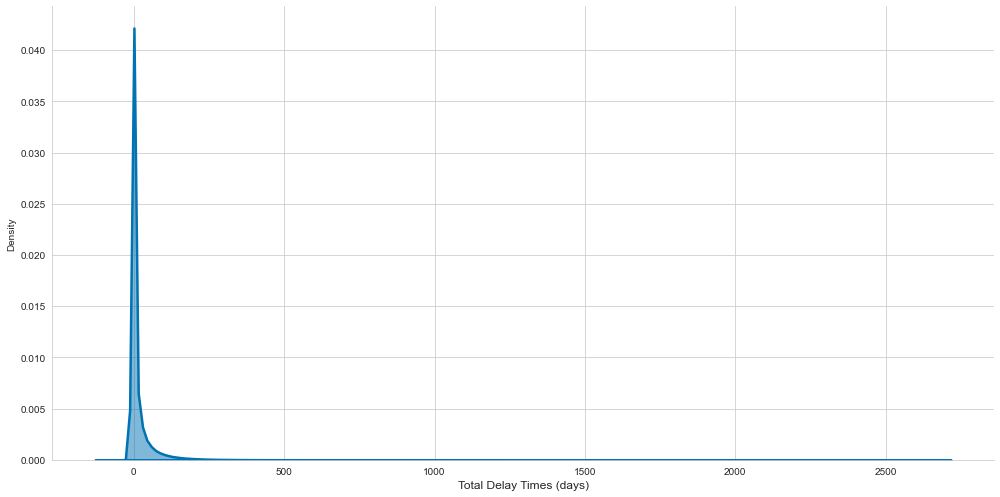

In [ ]:
#KDE - before:
g = sns.displot(data=flight_df, x="DEP_DELAY", kind="kde", height=7, aspect=2, fill=True,
alpha=.5, common_norm=False, common_grid=False, linewidth=2.5, palette="Paired",)

g.set_xlabels("Total Delay Times (days)", fontsize=12)


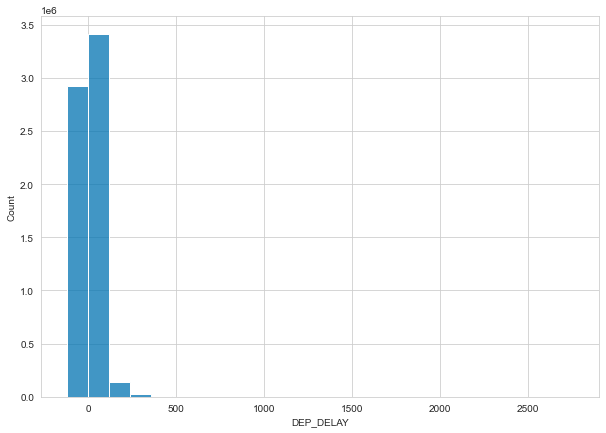

In [ ]:
# Histogram - before:
f, ax = plt.subplots(1,1, figsize=(10,7))

sns.color_palette("colorblind")
ax = sns.histplot(data=flight_df, x="DEP_DELAY", binwidth=120)
plt.show()

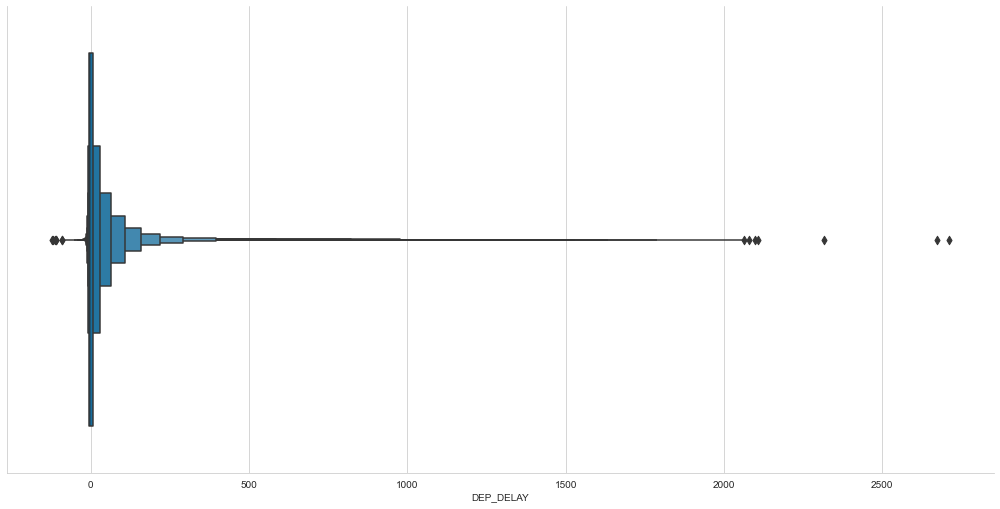

In [ ]:
# Boxen - before:
g = sns.catplot(
    data=flight_df, x='DEP_DELAY',
    kind='boxen', height=7, aspect= 2
)
# g.set_ylabels("Submitted to Publication (Days)", fontsize=15)
# g.set_xlabels("Main Subject Areas", fontsize=15)

# g.set(yticks=np.arange(0,1850,100))
# g.set_yticklabels(np.arange(0,1850,100), rotation=45)

g.despine()

plt.show()

In [ ]:
# Viewing the longest departure delays in the dataset:

flight_df.sort_values("DEP_DELAY", ascending = False)

,FL_DATE,ORIGIN,DEST,DEP_TIME,DEP_DELAY,ARR_TIME,ARR_DELAY,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,DISTANCE,fl_month,fl_day,fl_dow,is_holiday,airline_name,est_dep_time,est_arr_time
82048,2018-07-05,CLT,JFK,08:33:00,2710.0,10:21:00,2692.0,126.0,108.0,79.0,541.0,7,5,3,True,SkyWest Airlines,11,13
4558053,2019-02-17,DTW,LGA,14:00:00,2672.0,15:31:00,2649.0,114.0,91.0,70.0,502.0,2,17,6,True,American Eagle Airlines,17,19
7794268,2019-07-24,OGG,PHX,11:55:00,2315.0,21:16:00,2350.0,346.0,381.0,328.0,2845.0,7,24,2,False,American Airlines,21,6
2290164,2018-10-21,BDL,PHL,19:12:00,2109.0,21:13:00,2153.0,77.0,121.0,49.0,196.0,10,21,6,False,American Airlines,8,9
3230524,2018-12-09,TRI,ATL,00:02:00,2098.0,01:28:00,2108.0,76.0,86.0,37.0,227.0,12,9,6,False,SkyWest Airlines,13,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2591125,2018-11-06,GUM,SPN,15:01:00,-109.0,15:43:00,-108.0,41.0,42.0,24.0,129.0,11,6,1,False,United Airlines,17,18
2499150,2018-11-01,GUM,SPN,14:59:00,-111.0,15:44:00,-107.0,41.0,45.0,24.0,129.0,11,1,3,False,United Airlines,17,18
2640263,2018-11-08,SPN,GUM,16:33:00,-112.0,17:17:00,-108.0,40.0,44.0,24.0,129.0,11,8,3,False,United Airlines,18,19
2640264,2018-11-08,GUM,SPN,14:50:00,-120.0,15:39:00,-112.0,41.0,49.0,23.0,129.0,11,8,3,False,United Airlines,17,18


It seems that with a mean of 11 minutes and a median of -2 minutes, DEP_DELAY is skewed. Also, the maximum value is 2710 minutes, which is around 45 hours. This shows that there are extreme cases (outliers) in the dataset. These are also visible from the histogram, where due to the extreme delays, the distribution of the dataset can't be properly observed.

Outlier analysis would be helpful to both better visualize & analyze the dataset, as well as making model training easier and accurate.

There are different methods to utilize for outlier detection & removal, however in this project we can use 1.5 IQR range for quick filtering.

In [ ]:
def outlier_treatment(datacolumn):
 sorted(datacolumn)
 Q1,Q3 = np.percentile(datacolumn , [25,75])
 IQR = Q3 - Q1
 lower_range = Q1 - (1.5 * IQR)
 upper_range = Q3 + (1.5 * IQR)
 return lower_range,upper_range

In [ ]:
low_lim, up_lim = outlier_treatment(flight_df.DEP_DELAY)

In [ ]:
len(flight_df[(flight_df.DEP_DELAY > low_lim) & (flight_df.DEP_DELAY < up_lim)])

5639916

In [ ]:
# Checing the resulting outlier removed dataset:
flight_df[(flight_df.DEP_DELAY > low_lim) & (flight_df.DEP_DELAY < up_lim)].sort_values("DEP_DELAY", ascending = False)

,FL_DATE,ORIGIN,DEST,DEP_TIME,DEP_DELAY,ARR_TIME,ARR_DELAY,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,DISTANCE,fl_month,fl_day,fl_dow,is_holiday,airline_name,est_dep_time,est_arr_time
638155,2018-07-31,SFO,DEN,11:07:00,27.0,14:34:00,12.0,162.0,147.0,114.0,967.0,7,31,1,False,United Airlines,11,14
2403768,2018-10-27,ORF,BWI,15:32:00,27.0,16:23:00,18.0,60.0,51.0,35.0,159.0,10,27,5,False,Southwest Airlines,15,16
7955184,2019-07-31,ROC,ORD,12:08:00,27.0,13:02:00,29.0,112.0,114.0,88.0,528.0,7,31,2,False,American Eagle Airlines,12,13
7500063,2019-07-10,ATL,DAB,15:57:00,27.0,17:11:00,12.0,89.0,74.0,56.0,366.0,7,10,2,False,Delta Air Lines,16,17
7095068,2019-06-21,DTW,CLE,08:26:00,27.0,09:12:00,16.0,57.0,46.0,22.0,95.0,6,21,4,False,SkyWest Airlines,8,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4945628,2019-03-08,OGG,PHX,23:10:00,-24.0,07:27:00,-49.0,342.0,317.0,301.0,2845.0,3,8,4,False,American Airlines,0,8
6121716,2019-05-05,ROA,ATL,09:47:00,-24.0,11:12:00,-29.0,90.0,85.0,61.0,357.0,5,5,6,False,SkyWest Airlines,10,12
4127977,2019-01-25,SUN,SLC,17:36:00,-24.0,18:46:00,-20.0,66.0,70.0,36.0,222.0,1,25,4,False,SkyWest Airlines,18,19
2603424,2018-11-06,EAR,DEN,16:46:00,-24.0,17:08:00,-32.0,90.0,82.0,64.0,305.0,11,6,1,False,SkyWest Airlines,17,18


In [ ]:
print(f'Percentage of preserved data after 1.5 IQR: {round(len(flight_df[(flight_df.DEP_DELAY > low_lim) & (flight_df.DEP_DELAY < up_lim)])*100/len(flight_df),1)}%')


Percentage of preserved data after 1.5 IQR: 86.7%


One thing to note is that using 1.5 IQR range has removed the extreme cases from the dataset, however the DEP_DELAY now ranges between -24 to 27 minutes. As a flight needs to be later than 15 minutes to be classified as officially late, this means that the filtered dataset is heavily unbalanced in terms of officially on-time/delayed flights.

As this is a regression project, this does not directly effect us, however to fix this, we can increase the IQR range to include only very extreme delay cases.

Checking 2.5 IQR range:

In [ ]:
def outlier_treatment(datacolumn):
 sorted(datacolumn)
 Q1,Q3 = np.percentile(datacolumn , [25,75])
 IQR = Q3 - Q1
 lower_range = Q1 - (2.5 * IQR)
 upper_range = Q3 + (2.5 * IQR)
 return lower_range,upper_range

In [ ]:
low_lim, up_lim = outlier_treatment(flight_df.DEP_DELAY)

In [ ]:
print(f'Percentage of preserved data after 2.5 IQR: {round(len(flight_df[(flight_df.DEP_DELAY > low_lim) & (flight_df.DEP_DELAY < up_lim)])*100/len(flight_df),1)}%')


Percentage of preserved data after 2.5 IQR: 90.2%


In [ ]:
# Checing the resulting outlier removed dataset:
flight_df[(flight_df.DEP_DELAY > low_lim) & (flight_df.DEP_DELAY < up_lim)].sort_values("DEP_DELAY", ascending = False)

,FL_DATE,ORIGIN,DEST,DEP_TIME,DEP_DELAY,ARR_TIME,ARR_DELAY,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,DISTANCE,fl_month,fl_day,fl_dow,is_holiday,airline_name,est_dep_time,est_arr_time
8399084,2019-08-21,SBN,DTW,14:59:00,40.0,15:59:00,35.0,65.0,60.0,36.0,157.0,8,21,2,False,SkyWest Airlines,14,15
848795,2018-08-10,ATL,GSO,20:12:00,40.0,21:26:00,34.0,80.0,74.0,51.0,306.0,8,10,4,False,Delta Air Lines,20,21
3802674,2019-01-07,ATL,MSP,17:15:00,40.0,18:37:00,17.0,165.0,142.0,128.0,907.0,1,7,0,False,Delta Air Lines,17,18
1526998,2018-09-13,DFW,BNA,09:47:00,40.0,11:24:00,22.0,115.0,97.0,81.0,631.0,9,13,3,False,American Airlines,9,11
849282,2018-08-10,CLT,SGF,14:09:00,40.0,15:18:00,33.0,136.0,129.0,104.0,708.0,8,10,4,False,American Eagle Airlines,13,15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1605666,2018-09-17,ROA,ATL,05:23:00,-37.0,07:14:00,-14.0,88.0,111.0,93.0,357.0,9,17,0,False,SkyWest Airlines,6,7
285477,2018-07-15,MEI,PIB,20:03:00,-37.0,20:39:00,-38.0,37.0,36.0,17.0,69.0,7,15,6,False,SkyWest Airlines,21,21
5169149,2019-03-19,ASE,DEN,19:48:00,-37.0,20:43:00,-46.0,64.0,55.0,32.0,125.0,3,19,1,False,SkyWest Airlines,20,21
305534,2018-07-16,UIN,CGI,21:41:00,-37.0,22:30:00,-45.0,57.0,49.0,32.0,207.0,7,16,0,False,SkyWest Airlines,22,23


It is seen that now DEP_DELAY ranges between -37 to 40 minutes. It increases the rate of preserved data to 90.2%, so 10% of extreme values are still removed.  Will continue with this range instead.

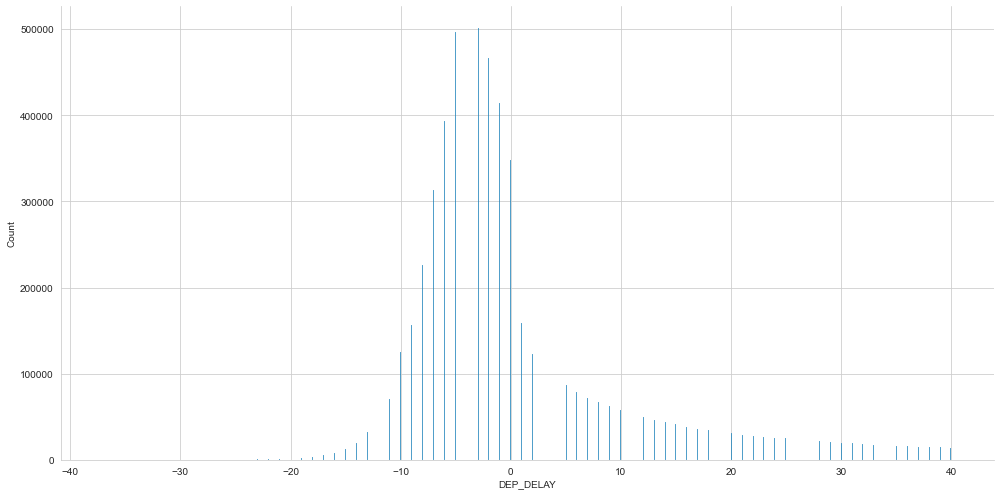

In [ ]:
# Histogram - after:
g = sns.displot(data=flight_df[(flight_df.DEP_DELAY > low_lim) & (flight_df.DEP_DELAY < up_lim)], x="DEP_DELAY", height=7, aspect=2)

plt.show()


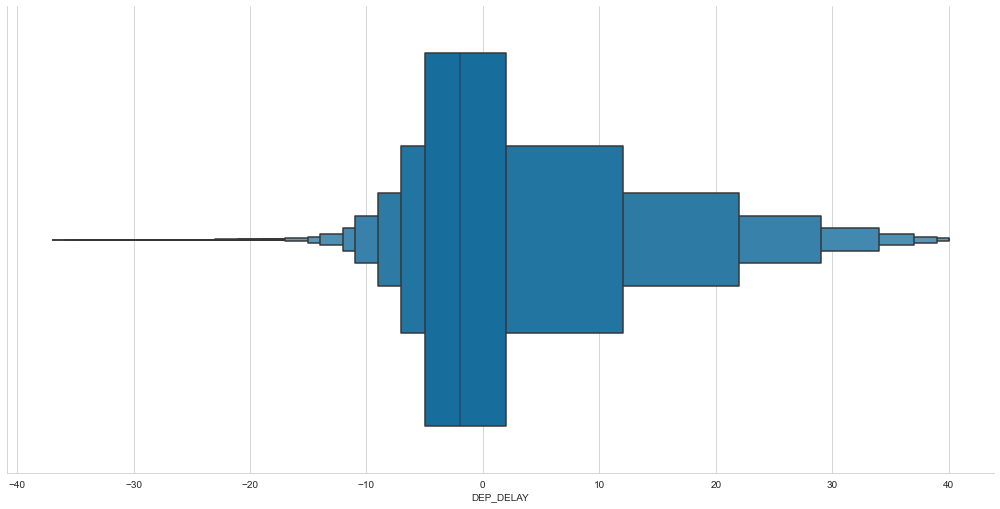

In [ ]:
# Boxen - after:
g = sns.catplot(
    data=flight_df[(flight_df.DEP_DELAY > low_lim) & (flight_df.DEP_DELAY < up_lim)], x='DEP_DELAY',
    kind='boxen', height=7, aspect= 2
)
# g.set_ylabels("Submitted to Publication (Days)", fontsize=15)
# g.set_xlabels("Main Subject Areas", fontsize=15)

# g.set(yticks=np.arange(0,1850,100))
# g.set_yticklabels(np.arange(0,1850,100), rotation=45)

g.despine()

plt.show()

The analysis shows that after the outlier elimination, the departure delay ditribution resembles a  normal distribution with some skewedness.

In [ ]:
print(f'Percentage of preserved data after outlier elimination: {round(len(flight_df[(flight_df.DEP_DELAY > low_lim) & (flight_df.DEP_DELAY < up_lim)])*100/len(flight_df),1)}%')
print(f"Size of dataset after outlier elimination: {len(flight_df[(flight_df.DEP_DELAY > low_lim) & (flight_df.DEP_DELAY < up_lim)])}")

Percentage of preserved data after outlier elimination: 90.2%
Size of dataset after outlier elimination: 5864729


In [ ]:
# Creating a full version of df as backup:
flight_df_all = flight_df.copy()

In [ ]:
# Removing outliers:
flight_df = flight_df.loc[(flight_df.DEP_DELAY > low_lim) & (flight_df.DEP_DELAY < up_lim),:]

#### 2.6 - Delay Status:

In [ ]:
# We can use 15 min treshold to create a bool delay_status variable:
flight_df["delay_status"] = np.where(flight_df["DEP_DELAY"] >= 15, True, False)

### Part 3: Explanatory Data Analysis

#### Correlation Heatmap:

In [ ]:
flight_corr = flight_df.corr()

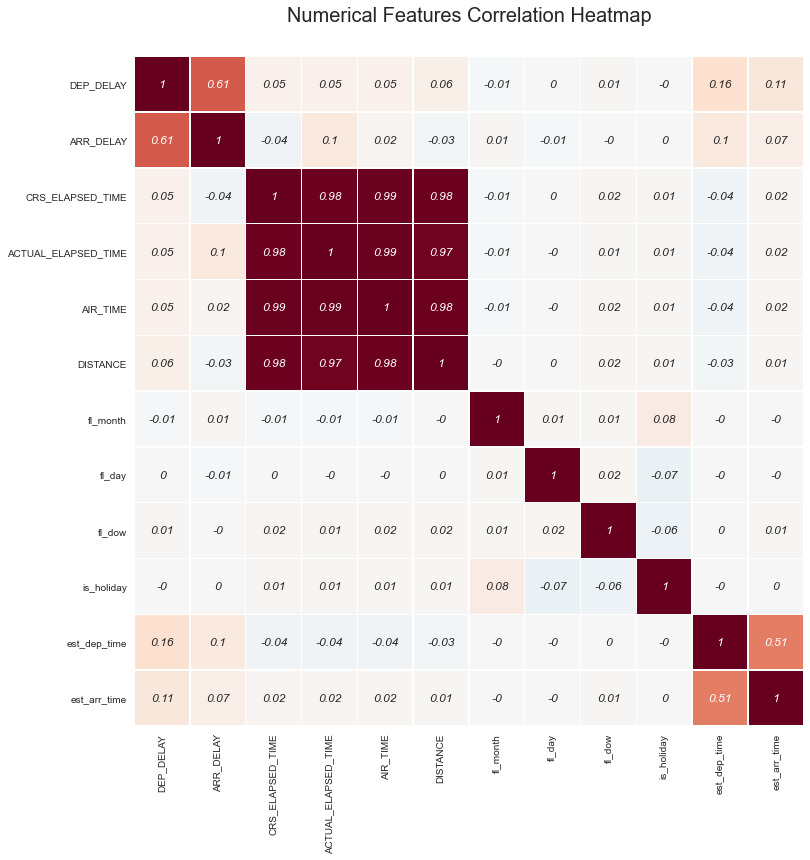

In [ ]:
f, ax = plt.subplots(1,1, figsize=(12,24))

ax = sns.heatmap(flight_corr, square=True, annot=True, linewidth=0.3, ax=ax, fmt=".3g", annot_kws={"fontsize":12, "fontstyle":"italic"}, robust=True, cmap="RdBu_r", vmin=-1, vmax=1, cbar=False)


ax.set_title("Numerical Features Correlation Heatmap", size=20, pad=35)



# ax.tick_params(axis='both', which='major', labelsize=10, labelbottom = False, bottom=False, top = False, labeltop=True)
plt.show()

Our target variable DEP_DELAY shows correlation with ARR_DELAY which is expected. However, this variable can't be used in modeling. It is also weak correlated with estimated departure and arrival time variables.

In terms of features, DISTANCE, AIR_TIME, ACTUAL_ELAPSED_TIME and  CRD_ELAPSED_TIME all show really really high correlation. As only CRS_ELAPSED_TIME is eligible to be used in modeling, this is no issue for us. In other cases, one of these columns could be sued to represent them all.


#### Pairplots:

In [ ]:
plt = sns.pairplot(flight_df, height=7)

Due to the number of columns pairplot is quite big and hard to analyze. As it took quite a while to draw I decided not to delete it. 

The highly correlated variables from heatmap can also be observed here.

#### Quesion 1 - Best / Worst Airlines 

__How do flight delays differ between airline companies?__

Airline_name is the only categorical variable in our dataset, so it can be further analyzed for arline performance:


Number of flights:

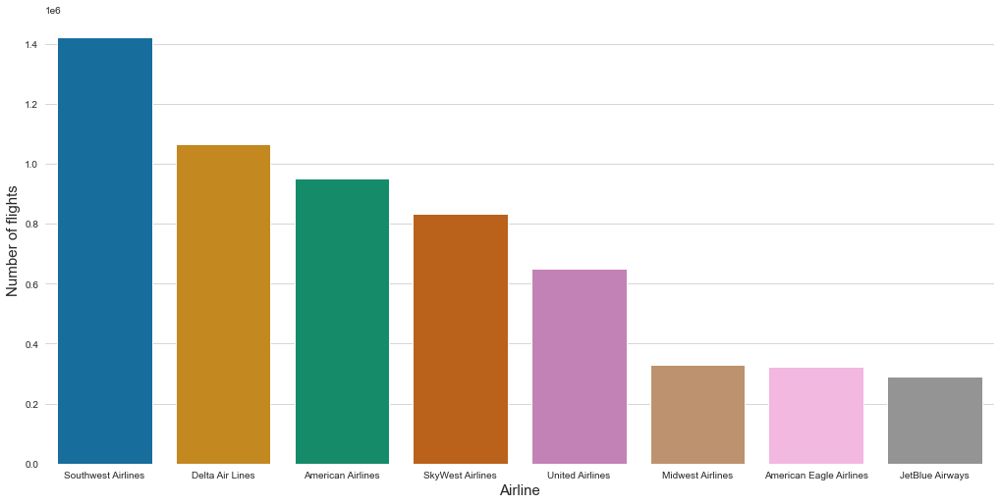

In [ ]:
g= sns.catplot(
    data=flight_df, x='airline_name', kind='count', height=7, aspect= 2,
    order= flight_df.airline_name.value_counts().index
)
g.set_xlabels("Airline", fontsize=15)
g.set_ylabels("Number of flights", fontsize=15)
g.despine(left=True, bottom=True)
plt.show()

Number of delayed flights:

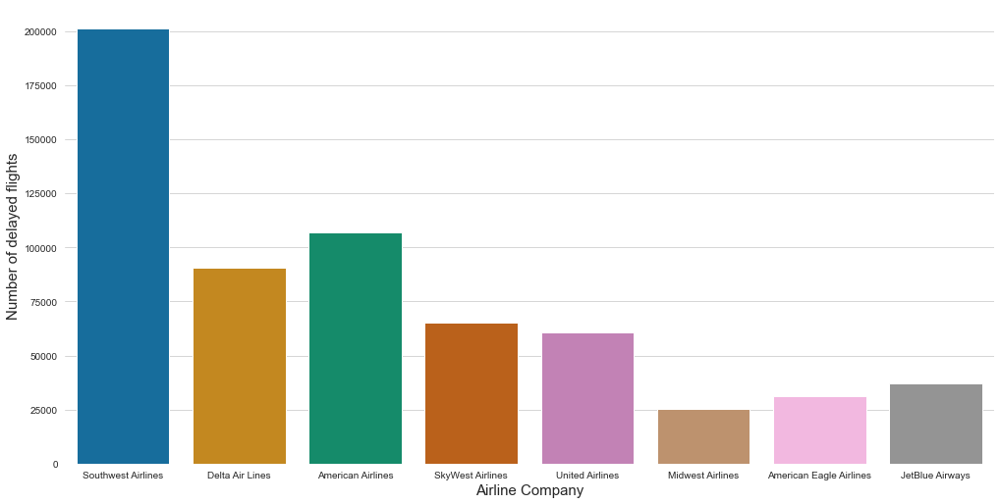

In [ ]:
g= sns.catplot(
    data=flight_df[flight_df.delay_status == True], x='airline_name', kind='count', height=7, aspect= 2,
    order= flight_df.airline_name.value_counts().index
)
g.set_xlabels("Airline Company", fontsize=15)
g.set_ylabels("Number of delayed flights", fontsize=15)
g.despine(left=True, bottom=True)
plt.show()

Both graphs stacked:

In [ ]:
airline_pivot = pd.pivot_table(data=flight_df.reset_index(), index="airline_name",columns="delay_status",aggfunc="count",values="index", margins = True)

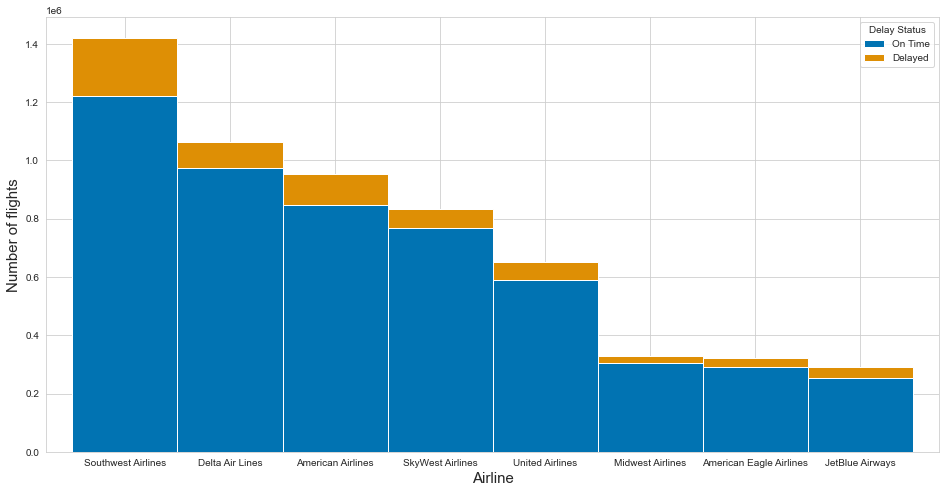

In [ ]:
g = airline_pivot.iloc[:-1,:-1].loc[flight_df.airline_name.value_counts().index,].plot(kind='bar', stacked=True, figsize=(16, 8), width=1)

g.legend(["On Time","Delayed"], title="Delay Status")

g.set_ylabel("Number of flights", fontsize=15)

g.set_xlabel("Airline", fontsize=15)

for item in g.get_xticklabels():
    item.set_rotation(0)

plt.show()

Percentage of delayed flights per airline:

In [ ]:
airline_pivot["True_perc"] = airline_pivot[True] / airline_pivot["All"] 
airline_pivot["False_perc"] = airline_pivot[False] / airline_pivot["All"]

In [ ]:
airline_pivot["True_perc"].round(2)

airline_name
American Airlines          0.11
American Eagle Airlines    0.10
Delta Air Lines            0.09
JetBlue Airways            0.13
Midwest Airlines           0.08
SkyWest Airlines           0.08
Southwest Airlines         0.14
United Airlines            0.09
All                        0.11
Name: True_perc, dtype: float64

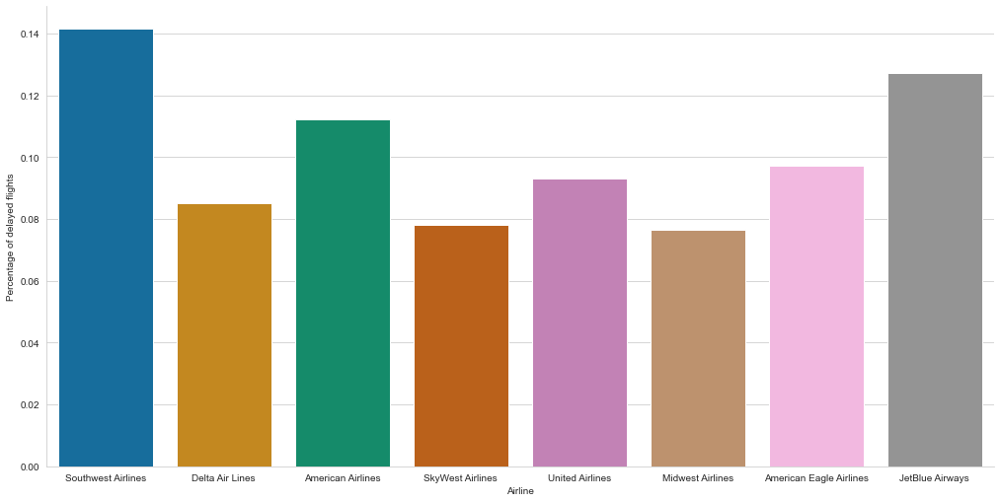

In [ ]:
g = sns.catplot(y="True_perc", x="airline_name", data=airline_pivot.reset_index(), kind="bar", ci=None, height=7, aspect= 2, order=flight_df.airline_name.value_counts().index)
g.set_xlabels("Airline")
g.set_ylabels("Percentage of delayed flights")
plt.show()

Avg. Delay time per airline:

In [ ]:
flight_df.groupby("airline_name")["DEP_DELAY"].mean().sort_values(ascending=False)

airline_name
Southwest Airlines         3.443586
American Airlines          0.897375
Delta Air Lines            0.269045
JetBlue Airways           -0.417510
United Airlines           -0.534819
American Eagle Airlines   -0.854548
SkyWest Airlines          -1.869189
Midwest Airlines          -2.025086
Name: DEP_DELAY, dtype: float64

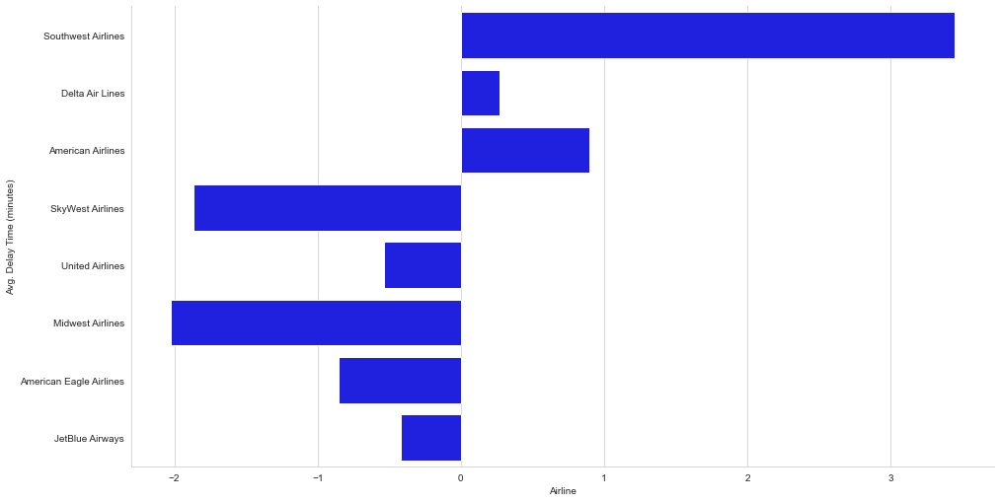

In [44]:
g = sns.catplot(x="DEP_DELAY", y="airline_name", data=flight_df, kind="bar", color="blue", ci=None, height=7, aspect= 2, order=flight_df.airline_name.value_counts().index)
g.set_xlabels("Airline")
g.set_ylabels("Avg. Delay Time (minutes)")
g.despine()
plt.show()

__Outcomes and Actions:__

ıt can be seen that Soutwest Airlines both have the highest delay ratio and average delay time among the airlines. This might cause problems among the customers & brand image.

Inversely, SkyWest and Miswest airlines both have the lowest ratio and average delay. If I were to travel in the US, I'd definetely prefer these airlines and avoid Southwest if possible!

#### Question 2: Does holidays effect departure delays?

In [215]:
holiday_pivot = pd.pivot_table(data=flight_df.reset_index(), index="is_holiday",columns="delay_status",aggfunc="count",values="index", margins = True)

In [217]:
holiday_pivot["True_perc"] = holiday_pivot[True] / holiday_pivot["All"] 
holiday_pivot["False_perc"] = holiday_pivot[False] / holiday_pivot["All"]

In [218]:
holiday_pivot

delay_status,False,True,All,True_perc,False_perc
is_holiday,,,,,
False,4617180,545754,5162934,0.105706,0.894294
True,629499,72296,701795,0.103016,0.896984
All,5246679,618050,5864729,0.105384,0.894616


In [214]:
flight_df.groupby("is_holiday")["DEP_DELAY"].mean()

is_holiday
False    0.537319
True     0.416585
Name: DEP_DELAY, dtype: float64

Personally it is quite surprising to see that the avg. delay and delay ratio for holidays and non-holidays are almost the same, as if they were randomly sampled from the dataset.

I might be biased from personal experience but further analysis is required to convince me to this fact.

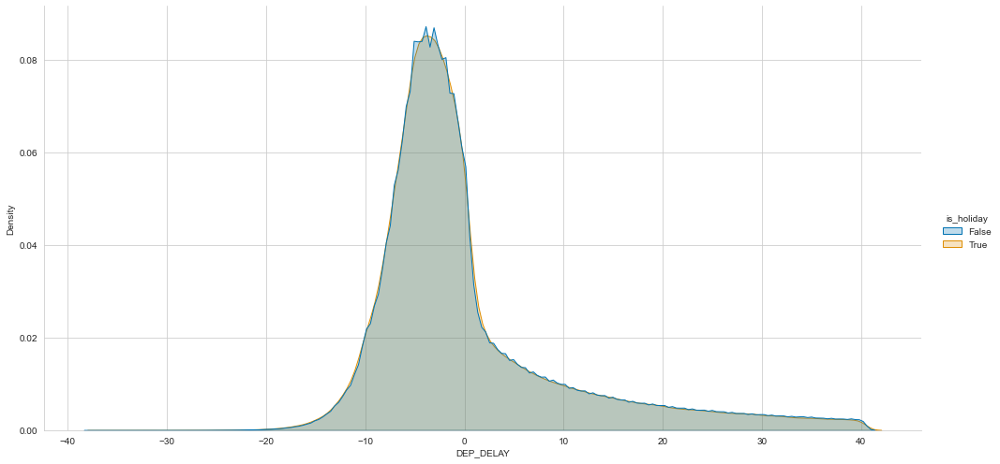

In [6]:
g = sns.displot(data=flight_df, x="DEP_DELAY", hue="is_holiday",height=7, aspect=2, multiple="layer", common_norm=False, kind="kde", fill=True)

plt.show()


The distribution also shows how similar the two groups are further indicating that holidays are not a significant factor for flight delays. 

#### Question 3: Best / worst time for a flight

How does departure delay differ between hours of the day?

In [8]:
hour_pivot = pd.pivot_table(data=flight_df.reset_index(), index="est_dep_time",columns="delay_status",aggfunc="count",values="index", margins = True)

In [11]:
hour_pivot["True_perc"] = hour_pivot[True] / hour_pivot["All"] 


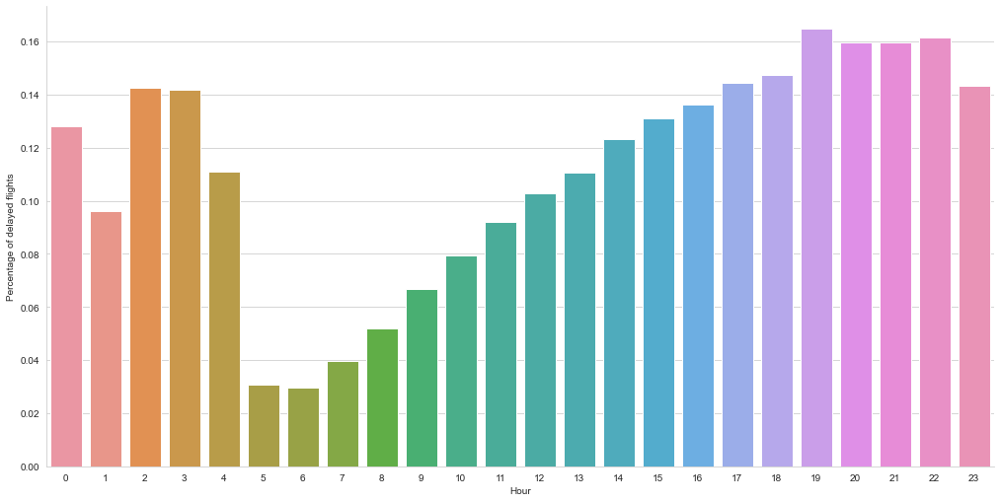

In [16]:
g = sns.catplot(y="True_perc", x="est_dep_time", data=hour_pivot.reset_index(), kind="bar", ci=None, height=7, aspect= 2, order=range(24))
g.set_xlabels("Hour")
g.set_ylabels("Percentage of delayed flights")
plt.show()

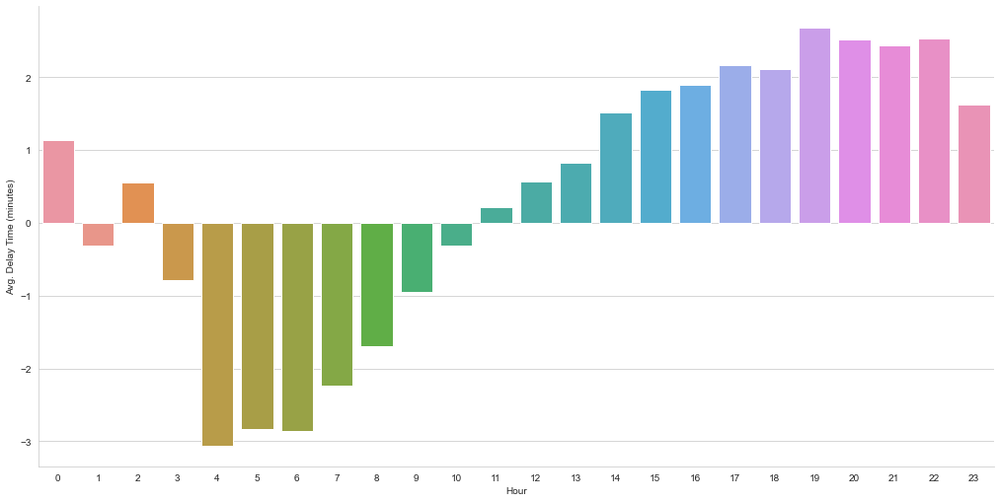

In [46]:
g = sns.catplot(y="DEP_DELAY", x="est_dep_time", data=flight_df, kind="bar", ci=None, height=7, aspect= 2, order=range(24))
g.set_xlabels("Hour")
g.set_ylabels("Avg. Delay Time (minutes)")
g.despine()
plt.show()

__Outcomes & Actions:__

The graphs show that hour plays a significant role in flight delays. Morning hours seem like the best time to book a flight as both delay reatio and the average delay are lowest. During rush hour towards the evening flight are delayed more and have a higher average delay time. It is also interesting that accorign to our dataset this "rush hour traffic" effect continues throughout the evening until 3 AM.

In [ ]:
flight_df_all.to_csv("flight_df_all.csv")

### Part 4: Model

The dataset now should be ready for modeling. All the features are cleaned, analyzed and engineered. 

The next step is to filter out any "unusable" or "unavailable" features, as "Scheduled departure time of the flight is the last available moment for doing prediction.". Naturally, actual departure and arrival times, air time, arrival delay, actual elapsed time can't be used for delay time prediction. These features were kept until this step as they might be useful during EDA.

#### 4.1 - Preparing the dataset for model

In [ ]:
flight_df.columns

Index(['FL_DATE', 'ORIGIN', 'DEST', 'DEP_TIME', 'DEP_DELAY', 'ARR_TIME',
       'ARR_DELAY', 'CRS_ELAPSED_TIME', 'ACTUAL_ELAPSED_TIME', 'AIR_TIME',
       'DISTANCE', 'fl_month', 'fl_day', 'fl_dow', 'is_holiday',
       'airline_name', 'est_dep_time', 'est_arr_time', 'delay_status',
       'orig_delay_rate', 'dest_delay_rate'],
      dtype='object')

In [ ]:
flight_train_df = flight_df.loc[:,['FL_DATE','est_dep_time', 'est_arr_time', 'CRS_ELAPSED_TIME', 'DISTANCE', 'fl_month', 'fl_day',
       'fl_dow','is_holiday', 'orig_delay_rate', 'dest_delay_rate','airline_name', 'DEP_DELAY']]

In [ ]:
sscaler = StandardScaler()
# ohencoder = OneHotEncoder(drop="first") 

In [ ]:
# Scaling the numerical features:
num_cols = ['est_dep_time', 'est_arr_time', 'CRS_ELAPSED_TIME', 'DISTANCE', 'fl_month', 'fl_day', 'fl_dow', 'orig_delay_rate', 'dest_delay_rate']

for col in num_cols:
    flight_train_df[col] =  sscaler.fit_transform(flight_train_df[[col]])

In [ ]:
# Encoding airline_names:
flight_train_df = pd.concat([flight_train_df,pd.get_dummies(flight_train_df["is_holiday"],drop_first=True, prefix="is_holiday"),pd.get_dummies(flight_train_df["airline_name"], prefix="airline")], axis=1)

In [ ]:
flight_train_df.drop(["airline_name","is_holiday"],axis=1,inplace=True)

In [ ]:
# Saving variables for backup:

with open("flight_df","wb") as p:
    pickle.dump(flight_df, p)

with open("flight_train_df","wb") as p:
    pickle.dump(flight_train_df, p)

The flight_train_df is ready for further steps.

__Next Steps & Observations:__

1. Need to split last 2 months as test dataset.
2. Need to create training & validation datasets. Here we can also use cross_val but due to the size of the dataset, the baseline models will be compared using a 70% - 30% split. This should allow more models to be tested. CV can then be used during hyperparameter tuning for better results & analysis.
3. As this is a regression problem, I chose  MSE as the evaluation metric for the models.



In [19]:
X_test = flight_train_df[flight_train_df["FL_DATE"].map(pd.to_datetime) >= '2019-07-01']

y_test = X_test["DEP_DELAY"]

X_test.drop(["FL_DATE","DEP_DELAY"], axis=1, inplace=True)

<ipython-input-19-e218f87bcbb6>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.drop(["FL_DATE","DEP_DELAY"], axis=1, inplace=True)


In [20]:
X = flight_train_df[flight_train_df["FL_DATE"].map(pd.to_datetime) < '2019-07-01']
y = X["DEP_DELAY"]

X.drop(["FL_DATE","DEP_DELAY"], axis=1, inplace=True)

<ipython-input-20-13f57efde6cf>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.drop(["FL_DATE","DEP_DELAY"], axis=1, inplace=True)


In [21]:
X_train, X_val, y_train, y_val = train_test_split(X,y, train_size=.7)

#### 4.2 - Linear Regression - Baseline Model:

__Version 1: LinReg__

As is tradition, starting with a simple Lin. Reg. model

In [185]:
linreg = LinearRegression(n_jobs=-1)

In [186]:
linreg.fit(X_train,y_train)

LinearRegression(n_jobs=-1)

In [187]:
mse_linreg = mean_squared_error(y_val, linreg.predict(X_val))
print("The mean squared error (MSE) on test set: {:.4f}".format(mse_linreg))

The mean squared error (MSE) on test set: 96.5206


In [188]:
linreg.score(X_val,y_val)

0.07085015691001406

__Version 2: Lasso Regression__

In [189]:
lasso = Lasso()
lasso.fit(X_train,y_train)

Lasso()

In [190]:
mse_lasso = mean_squared_error(y_val, lasso.predict(X_val))
print("The mean squared error (MSE) on test set: {:.4f}".format(mse_lasso))

The mean squared error (MSE) on test set: 101.6591


In [191]:
lasso.score(X_val,y_val)

0.021384769200487153

Lasso performed worse than LinearRegression model. Checking the feature coefficients:

In [195]:
pd.concat([pd.Series(X_train.columns),pd.Series(lasso.coef_)],axis=1).sort_values(1,ascending=False)

,0,1
0,est_dep_time,0.595224
7,orig_delay_rate,0.237731
8,dest_delay_rate,0.045247
10,airline_American Airlines,0.000000
16,airline_Southwest Airlines,0.000000
15,airline_SkyWest Airlines,-0.000000
14,airline_Midwest Airlines,-0.000000
13,airline_JetBlue Airways,-0.000000
12,airline_Delta Air Lines,-0.000000
11,airline_American Eagle Airlines,-0.000000


It seems that est. departure time has the highest importance for the Lasso model. Both origin and dest airport delay rates also played a part during prediction.

#### 4.3 - Random Forest Regression - Baseline Model


In [ ]:
rfg = RandomForestRegressor(n_estimators=500, max_depth=75, min_samples_leaf=1000, max_features=.3, n_jobs=-1, verbose=True)

rfg.fit(X_train, y_train)

mse_rfg = mean_squared_error(y_val, rfg.predict(X_val))
print("The mean squared error (MSE) on test set: {:.4f}".format(mse_rfg))

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:   44.9s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 418 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed: 12.1min finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.4s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    2.7s
[Parallel(n_jobs=16)]: Done 418 tasks      | elapsed:    6.4s


The mean squared error (MSE) on test set: 93.5382


[Parallel(n_jobs=16)]: Done 500 out of 500 | elapsed:    7.7s finished


In [ ]:
rfg.score(X_val,y_val)

[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.4s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    2.7s
[Parallel(n_jobs=16)]: Done 418 tasks      | elapsed:    6.3s
[Parallel(n_jobs=16)]: Done 500 out of 500 | elapsed:    7.5s finished


0.09956017342273737

Checking feat. importances again:

In [ ]:
pd.concat([pd.Series(X_train.columns),pd.Series(rfg.feature_importances_)],axis=1).sort_values(1,ascending=False)

,0,1
16,airline_Southwest Airlines,0.249753
0,est_dep_time,0.207207
1,est_arr_time,0.147767
7,orig_delay_rate,0.092370
4,fl_month,0.050475
3,DISTANCE,0.041269
8,dest_delay_rate,0.040500
15,airline_SkyWest Airlines,0.037189
2,CRS_ELAPSED_TIME,0.025943
6,fl_dow,0.022545


As Southwest Airlines both had the highest delay ratio & the highest average delay time, Random Forest givess the highest importance to that feature.

Estimated times and origin airport rate also have high importances, similar to the Lasso coefficients. 

Holiday feature was deemed unimportant by RF, which also proves our findings during EDA. I am still not ready to accept this fact.. 

In [ ]:
y_pred = rfg.predict(X_val)

[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.4s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    2.6s
[Parallel(n_jobs=16)]: Done 418 tasks      | elapsed:    6.9s
[Parallel(n_jobs=16)]: Done 500 out of 500 | elapsed:    8.2s finished


Prediction and validation testsets can be converted to a binary delayed column using >15 mins rule. This turns the problem into a classification problem:

In [35]:
bin_conv = lambda x: 1 if x>=15 else 0

In [ ]:
y_pred_bin = list(map(bin_conv,y_pred))
y_val_bin = list(map(bin_conv,y_val))

In [173]:
print(classification_report(y_val_bin, y_pred_bin))

c:\Users\oguzk\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\oguzk\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.90      1.00      0.94   1337969
           1       0.00      0.00      0.00    156778

    accuracy                           0.90   1494747
   macro avg       0.45      0.50      0.47   1494747
weighted avg       0.80      0.90      0.85   1494747



c:\Users\oguzk\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


The classification report shows that there are no >15 mins predictions, meaning model predicted all flights to be on-time.

As the dataset is heavily unbalanced for delayed flights and as our main task is regression not classification it is not a huge problem, however if predicting delay status was also a part of the assignment, this model may not be the best choice.


#### 4.4 - Gradient Boosting Regressor - Baseline Model:

In [ ]:
param_dict = {
    "n_estimators": 500,
    "max_depth": 4,
    "min_samples_split": 5,
    "learning_rate": 0.1
}

reg = GradientBoostingRegressor(**param_dict)
reg.fit(X_train, y_train)

mse = mean_squared_error(y_val, reg.predict(X_val))
print("The mean squared error (MSE) on test set: {:.4f}".format(mse))

The mean squared error (MSE) on test set: 91.8034


In [ ]:
reg.score(X_val,y_val)

0.11625989110032564

In [143]:
pd.concat([pd.Series(X_train.columns),pd.Series(reg.feature_importances_)],axis=1).sort_values(1,ascending=False)

,0,1
16,airline_Southwest Airlines,0.248049
0,est_dep_time,0.247838
4,fl_month,0.105017
7,orig_delay_rate,0.077335
5,fl_day,0.066590
1,est_arr_time,0.058524
3,DISTANCE,0.058436
6,fl_dow,0.034715
10,airline_American Airlines,0.021066
15,airline_SkyWest Airlines,0.018092


In [181]:
y_pred_reg = reg.predict(X_val)

In [182]:
y_pred_reg_bin = list(map(bin_conv,y_pred_reg))

In [183]:
print(classification_report(y_val_bin, y_pred_reg_bin))

              precision    recall  f1-score   support

           0       0.90      1.00      0.94   1337969
           1       0.65      0.00      0.00    156778

    accuracy                           0.90   1494747
   macro avg       0.77      0.50      0.47   1494747
weighted avg       0.87      0.90      0.85   1494747



In [203]:
confusion_matrix(y_val_bin, y_pred_reg_bin)

array([[1337946,      23],
       [ 156735,      43]], dtype=int64)

Gradient boosting regressor performed slightly better than RandomForests, and predictions also contain >15 min delays. 

#### 4.5 - XGBoost - Baseline Model:

In [30]:
xgbr = xgb.XGBRegressor(n_jobs=-1)
xgbr.fit(X_train, y_train)
 

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.300000012, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=6, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=-1,
             num_parallel_tree=1, predictor='auto', random_state=0, ...)

In [31]:
y_pred_xgbr = xgbr.predict(X_val)

In [32]:
mse_xgbr = mean_squared_error(y_val, y_pred_xgbr)
print("The mean squared error (MSE) on test set: {:.4f}".format(mse_xgbr))

The mean squared error (MSE) on test set: 91.3206


In [36]:
y_pred_xgbr_bin = list(map(bin_conv,y_pred_xgbr))

In [39]:
print(classification_report(y_val_bin, y_pred_xgbr_bin))

              precision    recall  f1-score   support

           0       0.89      1.00      0.94   1336784
           1       0.58      0.00      0.01    157963

    accuracy                           0.89   1494747
   macro avg       0.74      0.50      0.48   1494747
weighted avg       0.86      0.89      0.85   1494747



In [40]:
confusion_matrix(y_val_bin, y_pred_xgbr_bin)

array([[1336323,     461],
       [ 157329,     634]], dtype=int64)

XGBoost is performing similar to GBR. However, as XGBoost was run without any parameters given and has more predicitons with >15 mins. Both models seem eligible for further tuning, I have chosen to use XGBoost.

#### 4.6 - XGBoost - Hyperparemeter Tuning:

Increasing the number of estimators:

In [41]:
xgbr = xgb.XGBRegressor(n_estimators=250, n_jobs=-1)
xgbr.fit(X_train, y_train)
 

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.300000012, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=6, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=250, n_jobs=-1,
             num_parallel_tree=1, predictor='auto', random_state=0, ...)

In [42]:
y_pred_xgbr = xgbr.predict(X_val)

In [43]:
mse_xgbr = mean_squared_error(y_val, y_pred_xgbr)
print("The mean squared error (MSE) on test set: {:.4f}".format(mse_xgbr))

The mean squared error (MSE) on test set: 90.4513


Increasing n_estimators had a very slight improvement on the MSE score of the model. Further testing & tuning is necessary to find optimum model parameters. Due to limited time, we can try a random search CV to see if we can find a model that can perform better than the baseline model.

Performing Random Search to check for hyperparameter tuning options & better performance: 

In [29]:
params = { 'max_depth': [3, 5, 6, 10, 15, 20],
    'learning_rate': [0.01, 0.1, 0.2, 0.3],
    'subsample': np.arange(0.5, 1.0, 0.1),
    'colsample_bytree': np.arange(0.4, 1.0, 0.1),
    'colsample_bylevel': np.arange(0.4, 1.0, 0.1),
    'n_estimators': [100, 250, 500]}
    
xgbr = xgb.XGBRegressor(n_jobs=-1)
clf = RandomizedSearchCV(estimator=xgbr,
                param_distributions=params,
                scoring='neg_mean_squared_error',
                n_iter=10,
                cv=3,
                verbose=1)

clf.fit(X, y)

print("Best parameters:", clf.best_params_)
print("Lowest MSE: ", (-clf.best_score_))

Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best parameters: {'subsample': 0.7, 'n_estimators': 500, 'max_depth': 6, 'learning_rate': 0.01, 'colsample_bytree': 0.7, 'colsample_bylevel': 0.8999999999999999}
Lowest MSE:  95.30596173386006


Random search did not give us any effective results as the best performing model has a worse overall MSE than the baseline model. 

#### 4.7 - Best Performing XGBoost Model - Final Evaluation:

The best performing model up to this point is the baseline XGBoost with increased n_estimators. Due to time limits it is selected as the best model for this notebook and will be evaluated using the test set for an official eval. score 

In [47]:
xgbr = xgb.XGBRegressor(n_estimators=250, n_jobs=-1)
xgbr.fit(X, y)
 

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.300000012, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=6, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=250, n_jobs=-1,
             num_parallel_tree=1, predictor='auto', random_state=0, ...)

In [48]:
y_test_xgbr = xgbr.predict(X_test)

In [49]:
mse_xgbr = mean_squared_error(y_test, y_test_xgbr)
print("The mean squared error (MSE) on test set: {:.4f}".format(mse_xgbr))

The mean squared error (MSE) on test set: 96.0600


__Final Comments:__

The final MSE evaluation score of the model is 96. As mentioned above further hyperparameter tuning and model testing is required to improve this score.
